### Capstone 1.Human Activity Detection

 #### <span>Import Libraries</span>

In [1]:
import numpy as np 
import pandas as pd
import datetime as dt
import seaborn as sns #시각화
import matplotlib.pyplot as plt
import plotly.express as px #시각화

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

from sklearn.preprocessing import OneHotEncoder

### <span style="color:#BF1E96">1. .csv 파일 읽어오기 (test.csv, train.csv): df_test / df_train</span>

In [2]:
df_test = pd.read_csv(r'test.csv')
df_train = pd.read_csv(r'train.csv')

### <span style="color:#BF1E96">2. Data 크기 확인하기(test, train)</span>

In [3]:
print('test data 크기 확인 :',df_test.shape)
print('train data 크기 확인 :',df_train.shape)

test data 크기 확인 : (1541, 562)
train data 크기 확인 : (3609, 563)


### <span style="color:#BF1E96">3. Data SET 첫 5행 확인하기(test, train)</span>

In [4]:
print('test data 첫 5행')
df_test.head()

test data 첫 5행


,rn,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,tBodyAcc.mad.Z,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
0,3,0.280,-0.0195,-0.113,-0.995,-0.967,-0.979,-0.997,-0.964,-0.977,...,0.4150,-0.391,-0.760,-0.11900,0.1780,0.101,0.809,-0.849,0.181,-0.0491
1,5,0.277,-0.0166,-0.115,-0.998,-0.981,-0.990,-0.998,-0.980,-0.990,...,0.0878,-0.351,-0.699,0.12300,0.1230,0.694,-0.616,-0.848,0.185,-0.0439
2,9,0.277,-0.0218,-0.121,-0.997,-0.961,-0.984,-0.998,-0.957,-0.984,...,0.3140,-0.269,-0.573,0.01300,0.0809,-0.234,0.118,-0.848,0.189,-0.0374
3,17,0.279,-0.0148,-0.117,-0.997,-0.982,-0.983,-0.997,-0.982,-0.981,...,0.5610,-0.779,-0.940,-0.00145,-0.0481,-0.340,-0.229,-0.759,0.264,0.0270
4,26,0.279,-0.0145,-0.107,-0.998,-0.986,-0.993,-0.998,-0.985,-0.995,...,0.6770,-0.715,-0.937,0.02570,0.0665,-0.226,-0.225,-0.762,0.262,0.0294


In [5]:
print('train data 첫 5행')
df_train.head()

train data 첫 5행


,rn,activity,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
0,7,STANDING,0.279,-0.0196,-0.1100,-0.997,-0.967,-0.983,-0.997,-0.966,...,0.146,-0.217,-0.5640,-0.2130,-0.2310,0.0146,-0.190,-0.852,0.182,-0.0430
1,11,STANDING,0.277,-0.0127,-0.1030,-0.995,-0.973,-0.985,-0.996,-0.974,...,0.121,0.349,0.0577,0.0807,0.5960,-0.4760,0.116,-0.852,0.188,-0.0347
2,14,STANDING,0.277,-0.0147,-0.1070,-0.999,-0.991,-0.993,-0.999,-0.991,...,0.740,-0.564,-0.7660,0.1060,-0.0903,-0.1320,0.499,-0.850,0.189,-0.0351
3,15,STANDING,0.298,0.0271,-0.0617,-0.989,-0.817,-0.902,-0.989,-0.794,...,0.131,0.208,-0.0681,0.0623,-0.0587,0.0312,-0.269,-0.731,0.283,0.0364
4,20,STANDING,0.276,-0.0170,-0.1110,-0.998,-0.991,-0.998,-0.998,-0.989,...,0.667,-0.942,-0.9660,0.2450,0.1030,0.0661,-0.412,-0.761,0.263,0.0296


### <span style="color:#BF1E96">4. Data SET 통계값, Null 값 확인하기 (null 값이 있는 경우 행 삭제)</span>

#### 통계값 확인

In [6]:
df_test.describe(include='all')

,rn,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,tBodyAcc.mad.Z,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
count,1541.000000,1541.00000,1541.000000,1541.000000,1541.000000,1541.000000,1541.000000,1541.000000,1541.000000,1541.000000,...,1541.000000,1541.000000,1541.000000,1541.000000,1541.000000,1541.000000,1541.000000,1541.000000,1541.000000,1541.000000
mean,5161.052563,0.27582,-0.018046,-0.109217,-0.607266,-0.516822,-0.617703,-0.632406,-0.532077,-0.619526,...,0.132199,-0.316954,-0.634735,0.008390,0.014311,-0.000550,0.006301,-0.493145,0.061068,-0.054510
std,3018.400705,0.06066,0.024662,0.046271,0.440922,0.499209,0.400243,0.416450,0.483753,0.396243,...,0.246591,0.313443,0.297231,0.338114,0.450936,0.621036,0.482773,0.511159,0.303507,0.270579
min,3.000000,-0.41000,-0.268000,-0.347000,-0.999000,-1.000000,-0.999000,-0.999000,-1.000000,-1.000000,...,-0.786000,-1.000000,-0.993000,-1.000000,-1.000000,-0.999000,-0.991000,-0.997000,-0.987000,-0.971000
25%,2504.000000,0.26300,-0.024800,-0.121000,-0.992000,-0.978000,-0.980000,-0.993000,-0.979000,-0.979000,...,-0.014900,-0.551000,-0.848000,-0.129000,-0.279000,-0.526000,-0.370000,-0.814000,-0.018400,-0.136000
50%,5064.000000,0.27700,-0.017200,-0.109000,-0.945000,-0.865000,-0.862000,-0.951000,-0.869000,-0.857000,...,0.141000,-0.353000,-0.718000,0.011900,0.027500,-0.004190,0.001220,-0.723000,0.183000,-0.002240
75%,7888.000000,0.28900,-0.010400,-0.098300,-0.239000,-0.062700,-0.273000,-0.290000,-0.082100,-0.287000,...,0.293000,-0.140000,-0.523000,0.148000,0.301000,0.527000,0.377000,-0.512000,0.249000,0.103000
max,10294.000000,0.56400,0.153000,0.719000,0.718000,1.000000,0.753000,0.722000,1.000000,0.728000,...,0.947000,0.941000,0.927000,1.000000,1.000000,0.993000,0.991000,0.912000,0.901000,0.991000


In [7]:
df_train.describe()

,rn,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,tBodyAcc.mad.Z,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
count,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,...,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000
mean,5152.430590,0.274544,-0.017415,-0.109195,-0.608457,-0.506265,-0.614482,-0.634634,-0.521660,-0.616047,...,0.128804,-0.300815,-0.619400,0.007561,0.009484,0.029185,-0.010632,-0.496977,0.060040,-0.050202
std,2975.767839,0.063589,0.042589,0.056218,0.439157,0.501627,0.399514,0.413194,0.485282,0.394932,...,0.240278,0.317963,0.308303,0.332249,0.448971,0.613615,0.490830,0.509336,0.311308,0.263935
min,7.000000,-0.521000,-1.000000,-0.926000,-1.000000,-0.999000,-1.000000,-1.000000,-0.999000,-1.000000,...,-0.786000,-0.968000,-0.995000,-0.969000,-0.997000,-1.000000,-0.993000,-0.999000,-1.000000,-0.971000
25%,2570.000000,0.262000,-0.025200,-0.122000,-0.992000,-0.976000,-0.979000,-0.993000,-0.976000,-0.978000,...,-0.015800,-0.533000,-0.836000,-0.118000,-0.281000,-0.478000,-0.398000,-0.816000,-0.015600,-0.122000
50%,5158.000000,0.277000,-0.017200,-0.109000,-0.939000,-0.812000,-0.844000,-0.946000,-0.816000,-0.837000,...,0.132000,-0.341000,-0.706000,0.007740,0.009830,0.029600,-0.013400,-0.716000,0.183000,-0.005260
75%,7727.000000,0.287000,-0.011000,-0.098000,-0.254000,-0.051700,-0.283000,-0.306000,-0.084500,-0.288000,...,0.290000,-0.118000,-0.501000,0.142000,0.309000,0.554000,0.374000,-0.522000,0.252000,0.104000
max,10281.000000,0.693000,1.000000,1.000000,1.000000,0.980000,1.000000,1.000000,0.988000,1.000000,...,0.871000,0.990000,0.957000,0.981000,0.997000,0.999000,0.996000,0.977000,1.000000,0.998000


#### Null 값 확인

In [8]:
df_test.isnull()

,rn,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,tBodyAcc.mad.Z,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1536,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1537,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1538,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1539,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [9]:
df_test.isnull().sum(axis=0)

#df_test.isna().any()

rn                                     0
tBodyAcc.mean.X                        0
tBodyAcc.mean.Y                        0
tBodyAcc.mean.Z                        0
tBodyAcc.std.X                         0
                                      ..
angle.tBodyGyroMean.gravityMean        0
angle.tBodyGyroJerkMean.gravityMean    0
angle.X.gravityMean                    0
angle.Y.gravityMean                    0
angle.Z.gravityMean                    0
Length: 562, dtype: int64

In [10]:
df_test.dropna()

,rn,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,tBodyAcc.mad.Z,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
0,3,0.280,-0.01950,-0.1130,-0.9950,-0.9670,-0.979,-0.997,-0.9640,-0.977,...,0.4150,-0.391,-0.760,-0.11900,0.1780,0.101,0.809,-0.849,0.181,-0.0491
1,5,0.277,-0.01660,-0.1150,-0.9980,-0.9810,-0.990,-0.998,-0.9800,-0.990,...,0.0878,-0.351,-0.699,0.12300,0.1230,0.694,-0.616,-0.848,0.185,-0.0439
2,9,0.277,-0.02180,-0.1210,-0.9970,-0.9610,-0.984,-0.998,-0.9570,-0.984,...,0.3140,-0.269,-0.573,0.01300,0.0809,-0.234,0.118,-0.848,0.189,-0.0374
3,17,0.279,-0.01480,-0.1170,-0.9970,-0.9820,-0.983,-0.997,-0.9820,-0.981,...,0.5610,-0.779,-0.940,-0.00145,-0.0481,-0.340,-0.229,-0.759,0.264,0.0270
4,26,0.279,-0.01450,-0.1070,-0.9980,-0.9860,-0.993,-0.998,-0.9850,-0.995,...,0.6770,-0.715,-0.937,0.02570,0.0665,-0.226,-0.225,-0.762,0.262,0.0294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1536,10255,0.289,-0.02810,-0.0943,-0.0623,0.1140,-0.190,-0.114,0.0393,-0.207,...,0.2860,-0.237,-0.607,-0.19600,0.6980,0.990,-0.108,-0.806,0.190,0.1200
1537,10270,0.377,-0.01810,-0.1100,-0.3140,-0.1520,-0.214,-0.394,-0.1810,-0.266,...,-0.1910,-0.323,-0.753,-0.82900,0.0483,0.913,-0.904,-0.695,0.246,0.1730
1538,10272,0.253,-0.02490,-0.1700,-0.3080,-0.1890,-0.141,-0.377,-0.2260,-0.221,...,-0.1780,-0.142,-0.564,0.00451,0.3570,-0.946,0.614,-0.695,0.259,0.1580
1539,10289,0.277,0.00108,-0.0740,-0.0685,-0.2450,-0.145,-0.149,-0.3030,-0.199,...,-0.1040,0.161,-0.126,0.13400,0.8830,-0.994,0.475,-0.804,0.197,0.1140


In [11]:
df_train.isnull()

,rn,activity,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3604,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3605,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3606,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3607,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [12]:
df_train.isnull().sum(axis=0)

rn                                     0
activity                               0
tBodyAcc.mean.X                        0
tBodyAcc.mean.Y                        0
tBodyAcc.mean.Z                        0
                                      ..
angle.tBodyGyroMean.gravityMean        0
angle.tBodyGyroJerkMean.gravityMean    0
angle.X.gravityMean                    0
angle.Y.gravityMean                    0
angle.Z.gravityMean                    0
Length: 563, dtype: int64

In [13]:
df_train.dropna()

,rn,activity,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
0,7,STANDING,0.279,-0.01960,-0.1100,-0.9970,-0.9670,-0.983,-0.997,-0.9660,...,0.1460,-0.2170,-0.5640,-0.2130,-0.2310,0.0146,-0.1900,-0.852,0.182,-0.0430
1,11,STANDING,0.277,-0.01270,-0.1030,-0.9950,-0.9730,-0.985,-0.996,-0.9740,...,0.1210,0.3490,0.0577,0.0807,0.5960,-0.4760,0.1160,-0.852,0.188,-0.0347
2,14,STANDING,0.277,-0.01470,-0.1070,-0.9990,-0.9910,-0.993,-0.999,-0.9910,...,0.7400,-0.5640,-0.7660,0.1060,-0.0903,-0.1320,0.4990,-0.850,0.189,-0.0351
3,15,STANDING,0.298,0.02710,-0.0617,-0.9890,-0.8170,-0.902,-0.989,-0.7940,...,0.1310,0.2080,-0.0681,0.0623,-0.0587,0.0312,-0.2690,-0.731,0.283,0.0364
4,20,STANDING,0.276,-0.01700,-0.1110,-0.9980,-0.9910,-0.998,-0.998,-0.9890,...,0.6670,-0.9420,-0.9660,0.2450,0.1030,0.0661,-0.4120,-0.761,0.263,0.0296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3604,10277,WALKING_UPSTAIRS,0.357,-0.04460,-0.1300,-0.3140,-0.0556,-0.173,-0.386,-0.0575,...,0.0168,-0.1630,-0.5930,-0.7110,-0.0612,-0.7060,0.0646,-0.660,0.274,0.1760
3605,10278,WALKING_UPSTAIRS,0.344,0.00479,-0.1220,-0.3200,-0.0667,-0.182,-0.380,-0.0710,...,-0.0292,0.1810,-0.2500,-0.4030,-0.7060,0.7390,0.8710,-0.653,0.278,0.1800
3606,10279,WALKING_UPSTAIRS,0.284,-0.00796,-0.1190,-0.3090,-0.0804,-0.211,-0.369,-0.0971,...,-0.1100,0.0245,-0.3930,-0.0761,-0.2390,0.9600,0.0866,-0.657,0.272,0.1830
3607,10280,WALKING_UPSTAIRS,0.207,0.02460,-0.1040,-0.3650,-0.1690,-0.216,-0.449,-0.1860,...,-0.2140,-0.3520,-0.7340,0.5350,-0.2570,0.9270,-0.0843,-0.657,0.267,0.1880


### <span style="color:#BF1E96">5. “activity” 컬럼의 Unique 값, Unique count 값 확인 하기
</span>

#### Unique 값 확인

In [14]:
df_train['activity'].unique()

array(['STANDING', 'SITTING', 'LAYING', 'WALKING', 'WALKING_DOWNSTAIRS',
       'WALKING_UPSTAIRS'], dtype=object)

In [15]:
pd.unique(df_train['activity'])

array(['STANDING', 'SITTING', 'LAYING', 'WALKING', 'WALKING_DOWNSTAIRS',
       'WALKING_UPSTAIRS'], dtype=object)

#### Unique count 값 확인

In [16]:
df_train['activity'].value_counts()

LAYING                681
STANDING              668
SITTING               623
WALKING               603
WALKING_UPSTAIRS      541
WALKING_DOWNSTAIRS    493
Name: activity, dtype: int64

### <span style="color:#BF1E96">6. “activity” 컬럼의 Unique count 값 그래프 그리기</span>

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='activity', ylabel='count'>

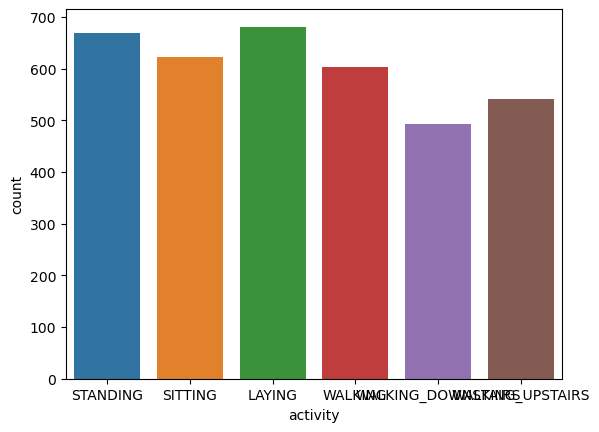

In [17]:
import seaborn as sns

sns.countplot(df_train['activity'])

In [18]:
import plotly.express as px

fig = px.pie(df_train, names='activity')
fig.show()

### <span style="color:#BF1E96">7. “activity” 컬럼과 다른 컬럼 상관 관계 확인하기</span>

corr():상관 행렬 가져오는 함수

In [19]:
import plotly.express as px
import plotly.graph_objects as go

corr_matrix = df_train.corr()

fig = go.Figure(data = go.Heatmap(
                                z = corr_matrix.values,
                                x = list(corr_matrix.columns),
                                y = list(corr_matrix.index)))

fig.update_layout(title = 'Correlation_activity')

fig.show()

### <span style="color:#BF1E96">8. rn 열 drop (df_test / df_train)</span>

In [20]:
df_train = df_train.drop('rn', axis = 1)
df_train

,activity,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,tBodyAcc.mad.Z,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
0,STANDING,0.279,-0.01960,-0.1100,-0.9970,-0.9670,-0.983,-0.997,-0.9660,-0.983,...,0.1460,-0.2170,-0.5640,-0.2130,-0.2310,0.0146,-0.1900,-0.852,0.182,-0.0430
1,STANDING,0.277,-0.01270,-0.1030,-0.9950,-0.9730,-0.985,-0.996,-0.9740,-0.985,...,0.1210,0.3490,0.0577,0.0807,0.5960,-0.4760,0.1160,-0.852,0.188,-0.0347
2,STANDING,0.277,-0.01470,-0.1070,-0.9990,-0.9910,-0.993,-0.999,-0.9910,-0.992,...,0.7400,-0.5640,-0.7660,0.1060,-0.0903,-0.1320,0.4990,-0.850,0.189,-0.0351
3,STANDING,0.298,0.02710,-0.0617,-0.9890,-0.8170,-0.902,-0.989,-0.7940,-0.888,...,0.1310,0.2080,-0.0681,0.0623,-0.0587,0.0312,-0.2690,-0.731,0.283,0.0364
4,STANDING,0.276,-0.01700,-0.1110,-0.9980,-0.9910,-0.998,-0.998,-0.9890,-0.997,...,0.6670,-0.9420,-0.9660,0.2450,0.1030,0.0661,-0.4120,-0.761,0.263,0.0296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3604,WALKING_UPSTAIRS,0.357,-0.04460,-0.1300,-0.3140,-0.0556,-0.173,-0.386,-0.0575,-0.217,...,0.0168,-0.1630,-0.5930,-0.7110,-0.0612,-0.7060,0.0646,-0.660,0.274,0.1760
3605,WALKING_UPSTAIRS,0.344,0.00479,-0.1220,-0.3200,-0.0667,-0.182,-0.380,-0.0710,-0.245,...,-0.0292,0.1810,-0.2500,-0.4030,-0.7060,0.7390,0.8710,-0.653,0.278,0.1800
3606,WALKING_UPSTAIRS,0.284,-0.00796,-0.1190,-0.3090,-0.0804,-0.211,-0.369,-0.0971,-0.301,...,-0.1100,0.0245,-0.3930,-0.0761,-0.2390,0.9600,0.0866,-0.657,0.272,0.1830
3607,WALKING_UPSTAIRS,0.207,0.02460,-0.1040,-0.3650,-0.1690,-0.216,-0.449,-0.1860,-0.326,...,-0.2140,-0.3520,-0.7340,0.5350,-0.2570,0.9270,-0.0843,-0.657,0.267,0.1880


In [21]:
df_test = df_test.drop('rn', axis = 1)
df_test

,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,tBodyAcc.mad.Z,tBodyAcc.max.X,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
0,0.280,-0.01950,-0.1130,-0.9950,-0.9670,-0.979,-0.997,-0.9640,-0.977,-0.9390,...,0.4150,-0.391,-0.760,-0.11900,0.1780,0.101,0.809,-0.849,0.181,-0.0491
1,0.277,-0.01660,-0.1150,-0.9980,-0.9810,-0.990,-0.998,-0.9800,-0.990,-0.9420,...,0.0878,-0.351,-0.699,0.12300,0.1230,0.694,-0.616,-0.848,0.185,-0.0439
2,0.277,-0.02180,-0.1210,-0.9970,-0.9610,-0.984,-0.998,-0.9570,-0.984,-0.9410,...,0.3140,-0.269,-0.573,0.01300,0.0809,-0.234,0.118,-0.848,0.189,-0.0374
3,0.279,-0.01480,-0.1170,-0.9970,-0.9820,-0.983,-0.997,-0.9820,-0.981,-0.9420,...,0.5610,-0.779,-0.940,-0.00145,-0.0481,-0.340,-0.229,-0.759,0.264,0.0270
4,0.279,-0.01450,-0.1070,-0.9980,-0.9860,-0.993,-0.998,-0.9850,-0.995,-0.9430,...,0.6770,-0.715,-0.937,0.02570,0.0665,-0.226,-0.225,-0.762,0.262,0.0294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1536,0.289,-0.02810,-0.0943,-0.0623,0.1140,-0.190,-0.114,0.0393,-0.207,0.3300,...,0.2860,-0.237,-0.607,-0.19600,0.6980,0.990,-0.108,-0.806,0.190,0.1200
1537,0.377,-0.01810,-0.1100,-0.3140,-0.1520,-0.214,-0.394,-0.1810,-0.266,-0.0726,...,-0.1910,-0.323,-0.753,-0.82900,0.0483,0.913,-0.904,-0.695,0.246,0.1730
1538,0.253,-0.02490,-0.1700,-0.3080,-0.1890,-0.141,-0.377,-0.2260,-0.221,0.0920,...,-0.1780,-0.142,-0.564,0.00451,0.3570,-0.946,0.614,-0.695,0.259,0.1580
1539,0.277,0.00108,-0.0740,-0.0685,-0.2450,-0.145,-0.149,-0.3030,-0.199,0.4030,...,-0.1040,0.161,-0.126,0.13400,0.8830,-0.994,0.475,-0.804,0.197,0.1140


### <span style="color:#BF1E96">9. “activity” 컬럼에 대하여 인코딩 하기</span>

In [22]:
print('각 클래스의 데이터 포인트 수 출력')
print(df_train['activity'].value_counts())
print('------------------------')

각 클래스의 데이터 포인트 수 출력
LAYING                681
STANDING              668
SITTING               623
WALKING               603
WALKING_UPSTAIRS      541
WALKING_DOWNSTAIRS    493
Name: activity, dtype: int64
------------------------


In [23]:
#from keras.utils import to_categorica
from tensorflow.keras.utils import to_categorical

label_encode = {"activity": {"LAYING":0, "STANDING":1, "SITTING":2, "WALKING":3, "WALKING_UPSTAIRS":4, "WALKING_DOWNSTAIRS":5}}

df_train.replace(label_encode,inplace=True) # .replace를 사용하여 다른 클래스를 숫자로 변경

print('각 클래스의 데이터 포인트 수를 출력하여 클래스가 숫자로 변경되었는지 확인')
print(df_train['activity'].value_counts())
print('------------------------')

# 클래스를 y_values로 추출
y_values = df_train['activity']

# y_values 원-핫 인코딩
y_values = to_categorical(y_values)

print('y_values 원-핫 인코딩 결과')
print(y_values)

각 클래스의 데이터 포인트 수를 출력하여 클래스가 숫자로 변경되었는지 확인
0    681
1    668
2    623
3    603
4    541
5    493
Name: activity, dtype: int64
------------------------
y_values 원-핫 인코딩 결과
[[0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1.]]


### <span style="color:#BF1E96">10. df_train 으로 X = “특성 컬럼”, y = “activity” 만들기</span>

In [24]:
features = [] # =X값으로 넣을 예정

for col in df_train.columns:
    if col != 'activity':
         features.append(col)

print(len(features))

target = 'activity' # =y값으로 넣을 예정

561


In [25]:
features = np.array(features)
print("array :\n",features.shape)


array :
 (561,)


In [26]:
# activity컬럼을 Target으로 Dataset 나누기

X = df_train[features]  # X=입력값=문제지=특성들
y = df_train[target]  # y=출력값=정답지=target value

### <span style="color:#BF1E96">11.(df.train에 대해서) X_train, X_test, y_train, y_test 만들기</span>

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25,random_state=42)
print("X_train values count:", len(X_train))
print("X_test values count:", len(X_test))
print("y_train values count:", len(y_train))
print("y_test values count:", len(y_test))

X_train values count: 2706
X_test values count: 903
y_train values count: 2706
y_test values count: 903


### <span style="color:#BF1E96">12. X_train, X_test 정규화 하기(옵션)</span>

####  <span style="color:#BF1E96">+정규화</span>

In [28]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train_scale = sc.fit_transform(X_train)
X_test_scale = sc.fit_transform(X_test)  

### <span style="color:#BF1E96">13. AI Model : 분류</span>

### <span style="color:#BF1E96">14. .fit // .predict // score (정확도, 정밀도, 재현율, F1 Score)</span>

 #### * 랜덤 포레스트 분류기 적용

In [29]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(random_state = 1)
rfc.fit(X_train, y_train) # 문제지와 정답 쥐어주며 학습시키기

# X_test로 test 결과값 만들기
preds = rfc.predict(X_test)  # preds = 자기 방식대로 공부해서 답안지를 제출한 값이 담겨있음

# score 함수로 Mean accuracy 확인하기 
score = rfc.score(X_test, y_test)
print(score*100)

95.5703211517165


In [30]:
# classification_report 함수로 모델 평가하기
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       165
           1       0.95      0.91      0.93       179
           2       0.90      0.94      0.92       157
           3       0.97      0.97      0.97       154
           4       0.97      0.98      0.97       138
           5       0.95      0.95      0.95       110

    accuracy                           0.96       903
   macro avg       0.96      0.96      0.96       903
weighted avg       0.96      0.96      0.96       903



 #### * 의사 결정 트리 분류기 적용

In [31]:
dtc = DecisionTreeClassifier()

dtc.fit(X_train, y_train)
preds = dtc.predict(X_test)

score = dtc.score(X_test, y_test)
print(score)
print(score*100)

# classification_report 함수로 모델 평가하기
print(classification_report(y_test, preds))

0.884828349944629
88.4828349944629
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       165
           1       0.88      0.80      0.84       179
           2       0.80      0.89      0.84       157
           3       0.86      0.90      0.88       154
           4       0.88      0.82      0.85       138
           5       0.88      0.91      0.90       110

    accuracy                           0.88       903
   macro avg       0.89      0.89      0.88       903
weighted avg       0.89      0.88      0.88       903



 #### * 로지스틱 회귀 분류기

In [32]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()

lr.fit(X_train, y_train)
preds = lr.predict(X_test)

score = lr.score(X_test, y_test)
print(score)
print(score*100)
print()
print(classification_report(y_test, preds))

0.9756367663344407
97.56367663344408

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       165
           1       0.96      0.93      0.94       179
           2       0.92      0.96      0.94       157
           3       0.99      1.00      0.99       154
           4       1.00      0.99      0.99       138
           5       1.00      1.00      1.00       110

    accuracy                           0.98       903
   macro avg       0.98      0.98      0.98       903
weighted avg       0.98      0.98      0.98       903



C:\Users\User\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



 #### *GradientBoostingClassifier

In [33]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)

score = gb.score(X_test, y_test)
print(score*100)
print()
print(classification_report(y_test, preds))


97.2314507198228

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       165
           1       0.96      0.93      0.94       179
           2       0.92      0.96      0.94       157
           3       0.99      1.00      0.99       154
           4       1.00      0.99      0.99       138
           5       1.00      1.00      1.00       110

    accuracy                           0.98       903
   macro avg       0.98      0.98      0.98       903
weighted avg       0.98      0.98      0.98       903



### <span style="color:#BF1E96">15. df_test 에 대한 분류 하여 “activity” 컬럼 작성하여 test_result.csv 파일 만들기</span>

In [34]:
X = df_test
X.head()

,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,tBodyAcc.mad.Z,tBodyAcc.max.X,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
0,0.280,-0.0195,-0.113,-0.995,-0.967,-0.979,-0.997,-0.964,-0.977,-0.939,...,0.4150,-0.391,-0.760,-0.11900,0.1780,0.101,0.809,-0.849,0.181,-0.0491
1,0.277,-0.0166,-0.115,-0.998,-0.981,-0.990,-0.998,-0.980,-0.990,-0.942,...,0.0878,-0.351,-0.699,0.12300,0.1230,0.694,-0.616,-0.848,0.185,-0.0439
2,0.277,-0.0218,-0.121,-0.997,-0.961,-0.984,-0.998,-0.957,-0.984,-0.941,...,0.3140,-0.269,-0.573,0.01300,0.0809,-0.234,0.118,-0.848,0.189,-0.0374
3,0.279,-0.0148,-0.117,-0.997,-0.982,-0.983,-0.997,-0.982,-0.981,-0.942,...,0.5610,-0.779,-0.940,-0.00145,-0.0481,-0.340,-0.229,-0.759,0.264,0.0270
4,0.279,-0.0145,-0.107,-0.998,-0.986,-0.993,-0.998,-0.985,-0.995,-0.943,...,0.6770,-0.715,-0.937,0.02570,0.0665,-0.226,-0.225,-0.762,0.262,0.0294


In [35]:
X2 = df_test  # X=입력값=문제지=특성들

print(df_test.shape)

(1541, 561)


In [36]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X2 = sc.fit_transform(X2)  # 정규화 과정을 수행하는 함수

In [37]:
y.result = gb.predict(X2)
y.result

C:\Users\User\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names



array([1, 1, 1, ..., 5, 5, 5], dtype=int64)

In [38]:
df_test["activity"] = y.result

In [39]:
df_test = df_test.drop('activity', axis = 1)

In [40]:
df_test.insert(0,'activity', y.result)

### <span style="color:#BF1E96">16. Jupyter notebook, test_result.csv 파일 제출하기(+디코딩)</span>

In [44]:
label_decode = {"activity": {0:"STANDING",1:"SITTING", 2:"LAYING", 3:"WALKING",
                            4:"WALKING_DOWNSTAIRS", 5:"WALKING_UPSTAIRS"}}
df_test.replace(label_decode,inplace=True)
print(df_test['activity'].value_counts(ascending=True))

WALKING                27
LAYING                147
WALKING_DOWNSTAIRS    163
SITTING               291
STANDING              330
WALKING_UPSTAIRS      583
Name: activity, dtype: int64


In [45]:
df_test

,activity,tBodyAcc.mean.X,tBodyAcc.mean.Y,tBodyAcc.mean.Z,tBodyAcc.std.X,tBodyAcc.std.Y,tBodyAcc.std.Z,tBodyAcc.mad.X,tBodyAcc.mad.Y,tBodyAcc.mad.Z,...,fBodyBodyGyroJerkMag.meanFreq,fBodyBodyGyroJerkMag.skewness,fBodyBodyGyroJerkMag.kurtosis,angle.tBodyAccMean.gravity,angle.tBodyAccJerkMean.gravityMean,angle.tBodyGyroMean.gravityMean,angle.tBodyGyroJerkMean.gravityMean,angle.X.gravityMean,angle.Y.gravityMean,angle.Z.gravityMean
0,SITTING,0.280,-0.01950,-0.1130,-0.9950,-0.9670,-0.979,-0.997,-0.9640,-0.977,...,0.4150,-0.391,-0.760,-0.11900,0.1780,0.101,0.809,-0.849,0.181,-0.0491
1,SITTING,0.277,-0.01660,-0.1150,-0.9980,-0.9810,-0.990,-0.998,-0.9800,-0.990,...,0.0878,-0.351,-0.699,0.12300,0.1230,0.694,-0.616,-0.848,0.185,-0.0439
2,SITTING,0.277,-0.02180,-0.1210,-0.9970,-0.9610,-0.984,-0.998,-0.9570,-0.984,...,0.3140,-0.269,-0.573,0.01300,0.0809,-0.234,0.118,-0.848,0.189,-0.0374
3,SITTING,0.279,-0.01480,-0.1170,-0.9970,-0.9820,-0.983,-0.997,-0.9820,-0.981,...,0.5610,-0.779,-0.940,-0.00145,-0.0481,-0.340,-0.229,-0.759,0.264,0.0270
4,SITTING,0.279,-0.01450,-0.1070,-0.9980,-0.9860,-0.993,-0.998,-0.9850,-0.995,...,0.6770,-0.715,-0.937,0.02570,0.0665,-0.226,-0.225,-0.762,0.262,0.0294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1536,WALKING_UPSTAIRS,0.289,-0.02810,-0.0943,-0.0623,0.1140,-0.190,-0.114,0.0393,-0.207,...,0.2860,-0.237,-0.607,-0.19600,0.6980,0.990,-0.108,-0.806,0.190,0.1200
1537,WALKING_DOWNSTAIRS,0.377,-0.01810,-0.1100,-0.3140,-0.1520,-0.214,-0.394,-0.1810,-0.266,...,-0.1910,-0.323,-0.753,-0.82900,0.0483,0.913,-0.904,-0.695,0.246,0.1730
1538,WALKING_UPSTAIRS,0.253,-0.02490,-0.1700,-0.3080,-0.1890,-0.141,-0.377,-0.2260,-0.221,...,-0.1780,-0.142,-0.564,0.00451,0.3570,-0.946,0.614,-0.695,0.259,0.1580
1539,WALKING_UPSTAIRS,0.277,0.00108,-0.0740,-0.0685,-0.2450,-0.145,-0.149,-0.3030,-0.199,...,-0.1040,0.161,-0.126,0.13400,0.8830,-0.994,0.475,-0.804,0.197,0.1140


In [46]:
df_test.to_csv(r'./test_result.csv',index=False)